In [114]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from scipy.stats import norm 
import numpy as np

In [98]:
train = pd.read_csv('training.csv.xls')

In [99]:
train.shape

(95662, 16)

In [100]:
train.head()

,TransactionId,BatchId,AccountId,SubscriptionId,CustomerId,CurrencyCode,CountryCode,ProviderId,ProductId,ProductCategory,ChannelId,Amount,Value,TransactionStartTime,PricingStrategy,FraudResult
0,TransactionId_76871,BatchId_36123,AccountId_3957,SubscriptionId_887,CustomerId_4406,UGX,256,ProviderId_6,ProductId_10,airtime,ChannelId_3,1000.0,1000,2018-11-15T02:18:49Z,2,0
1,TransactionId_73770,BatchId_15642,AccountId_4841,SubscriptionId_3829,CustomerId_4406,UGX,256,ProviderId_4,ProductId_6,financial_services,ChannelId_2,-20.0,20,2018-11-15T02:19:08Z,2,0
2,TransactionId_26203,BatchId_53941,AccountId_4229,SubscriptionId_222,CustomerId_4683,UGX,256,ProviderId_6,ProductId_1,airtime,ChannelId_3,500.0,500,2018-11-15T02:44:21Z,2,0
3,TransactionId_380,BatchId_102363,AccountId_648,SubscriptionId_2185,CustomerId_988,UGX,256,ProviderId_1,ProductId_21,utility_bill,ChannelId_3,20000.0,21800,2018-11-15T03:32:55Z,2,0
4,TransactionId_28195,BatchId_38780,AccountId_4841,SubscriptionId_3829,CustomerId_988,UGX,256,ProviderId_4,ProductId_6,financial_services,ChannelId_2,-644.0,644,2018-11-15T03:34:21Z,2,0


In [96]:
print(train.describe(),"\n",'='*50,'\n')
print(train.info())

       CountryCode        Amount         Value  PricingStrategy   FraudResult
count      95662.0  9.566200e+04  9.566200e+04     95662.000000  95662.000000
mean         256.0  6.717846e+03  9.900584e+03         2.255974      0.002018
std            0.0  1.233068e+05  1.231221e+05         0.732924      0.044872
min          256.0 -1.000000e+06  2.000000e+00         0.000000      0.000000
25%          256.0 -5.000000e+01  2.750000e+02         2.000000      0.000000
50%          256.0  1.000000e+03  1.000000e+03         2.000000      0.000000
75%          256.0  2.800000e+03  5.000000e+03         2.000000      0.000000
max          256.0  9.880000e+06  9.880000e+06         4.000000      1.000000 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95662 entries, 0 to 95661
Data columns (total 16 columns):
TransactionId           95662 non-null object
BatchId                 95662 non-null object
AccountId               95662 non-null object
SubscriptionId          95662 non-null object
Cus

In [4]:
train.tail()

,TransactionId,BatchId,AccountId,SubscriptionId,CustomerId,CurrencyCode,CountryCode,ProviderId,ProductId,ProductCategory,ChannelId,Amount,Value,TransactionStartTime,PricingStrategy,FraudResult
95657,TransactionId_89881,BatchId_96668,AccountId_4841,SubscriptionId_3829,CustomerId_3078,UGX,256,ProviderId_4,ProductId_6,financial_services,ChannelId_2,-1000.0,1000,2019-02-13T09:54:09Z,2,0
95658,TransactionId_91597,BatchId_3503,AccountId_3439,SubscriptionId_2643,CustomerId_3874,UGX,256,ProviderId_6,ProductId_10,airtime,ChannelId_3,1000.0,1000,2019-02-13T09:54:25Z,2,0
95659,TransactionId_82501,BatchId_118602,AccountId_4841,SubscriptionId_3829,CustomerId_3874,UGX,256,ProviderId_4,ProductId_6,financial_services,ChannelId_2,-20.0,20,2019-02-13T09:54:35Z,2,0
95660,TransactionId_136354,BatchId_70924,AccountId_1346,SubscriptionId_652,CustomerId_1709,UGX,256,ProviderId_6,ProductId_19,tv,ChannelId_3,3000.0,3000,2019-02-13T10:01:10Z,2,0
95661,TransactionId_35670,BatchId_29317,AccountId_4841,SubscriptionId_3829,CustomerId_1709,UGX,256,ProviderId_4,ProductId_6,financial_services,ChannelId_2,-60.0,60,2019-02-13T10:01:28Z,2,0


In [53]:
train.FraudResult.value_counts()
# Highly Imbalanced Classes!

0    95469
1      193
Name: FraudResult, dtype: int64

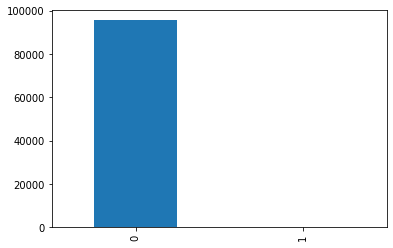

In [64]:
train.FraudResult.value_counts().plot(kind='bar')

In [7]:
cols = train.columns

In [10]:
for i in cols:
    print(i)
    exec("print(len(train.%s.value_counts()))"%(i))
    print('---')

TransactionId
95662
---
BatchId
94809
---
AccountId
3633
---
SubscriptionId
3627
---
CustomerId
3742
---
CurrencyCode
1
---
CountryCode
1
---
ProviderId
6
---
ProductId
23
---
ProductCategory
9
---
ChannelId
4
---
Amount
1676
---
Value
1517
---
TransactionStartTime
94556
---
PricingStrategy
4
---
FraudResult
2
---


### Here we can see that CountryCode & CurrencyCode have only 1 unique value; that makes those columns useless for our task

In [11]:
import plotly.express as px

fig = px.scatter(train, x='TransactionStartTime', y='FraudResult')
fig.show()

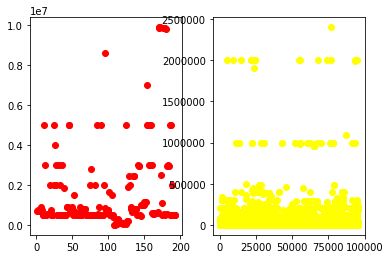

In [13]:
#plotting the dataset considering the class
color = {1:'red', 0:'yellow'}
fraudlist = train[train.FraudResult == 1]
normal = train[train.FraudResult == 0]
fig,axes = plt.subplots(1,2)

axes[0].scatter(list(range(1,fraudlist.shape[0] + 1)), fraudlist.Value,color='red')
axes[1].scatter(list(range(1, normal.shape[0] + 1)), normal.Value,color='yellow')
plt.show()

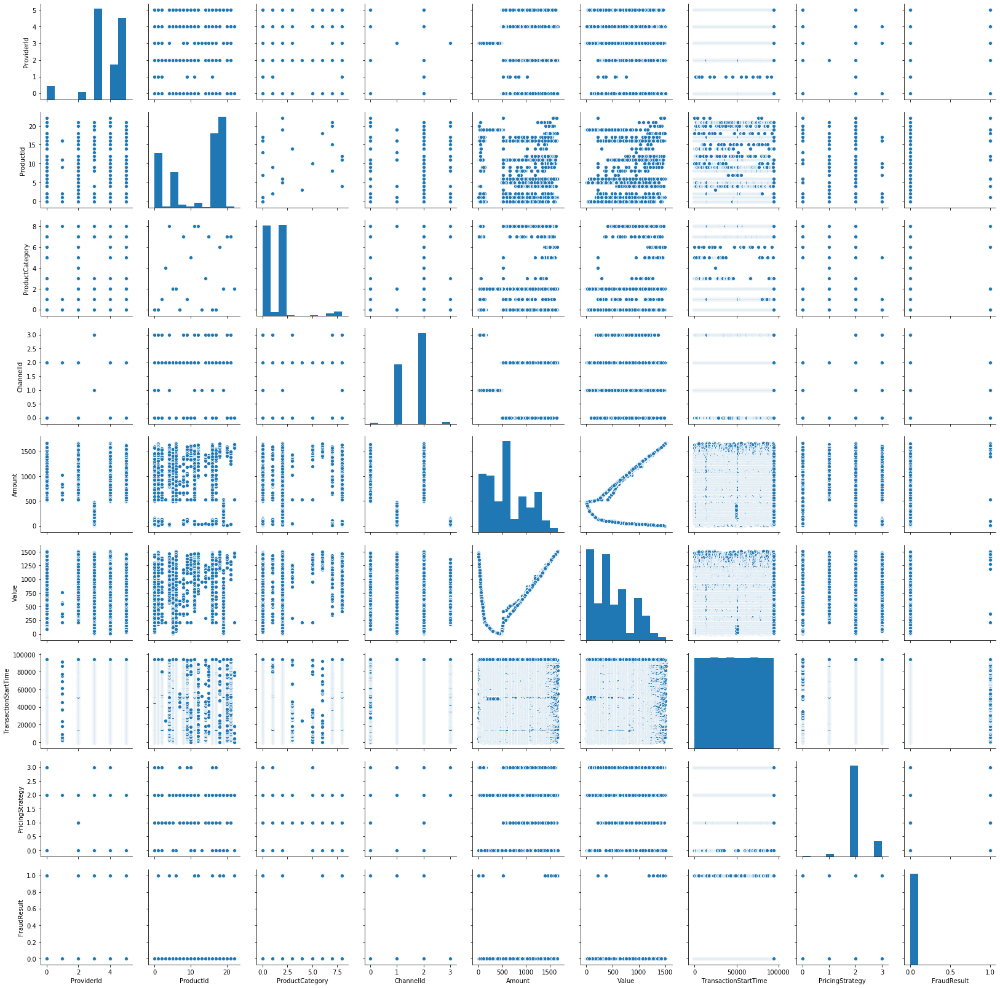

In [54]:
sns.pairplot(train.iloc[:,7:].apply(LabelEncoder().fit_transform))
# Hue function was NOT working giving "LinAlgError: Singular matrix" Error

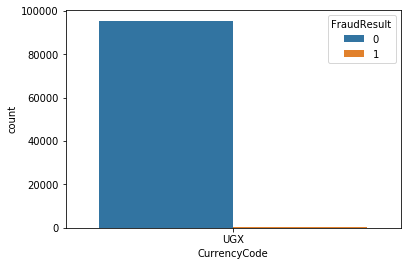

In [44]:
sns.countplot('CurrencyCode', hue= 'FraudResult', data=train)

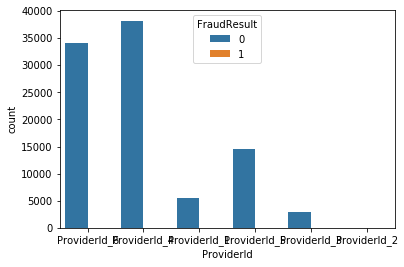

In [45]:
sns.countplot('ProviderId', hue= 'FraudResult', data=train)

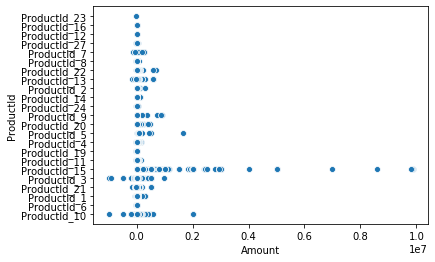

In [108]:
sns.scatterplot(x='Amount',y='ProductId',data = train)

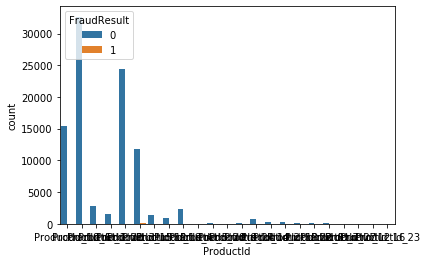

In [46]:
sns.countplot('ProductId', hue= 'FraudResult', data=train)

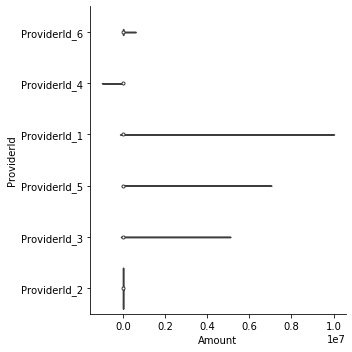

In [106]:
sns.catplot(x="Amount",y="ProviderId",kind='violin',data=train)

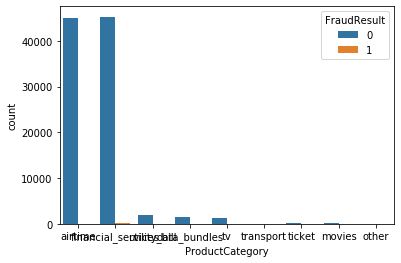

In [50]:
sns.countplot('ProductCategory', hue= 'FraudResult', data=train,orient='v')

(array([9.5641e+04, 2.1000e+01]),
 array([2.000000e+00, 4.940001e+06, 9.880000e+06]),
 <a list of 2 Patch objects>)

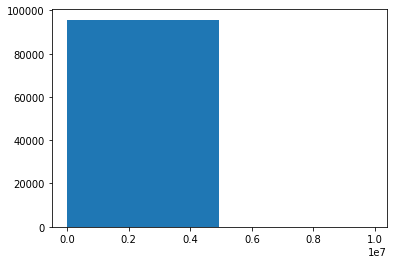

In [105]:
plt.hist(train.Value,bins=2)

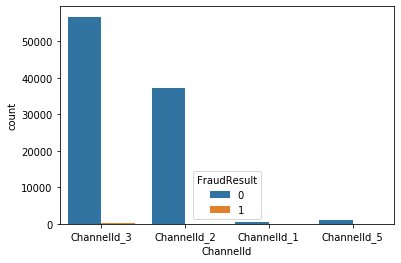

In [51]:
sns.countplot('ChannelId', hue= 'FraudResult', data=train)

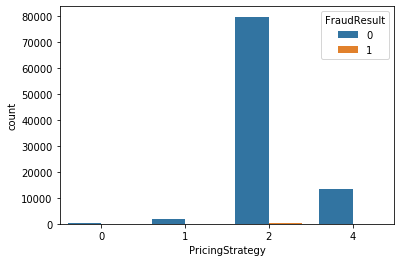

In [52]:
sns.countplot('PricingStrategy', hue= 'FraudResult', data=train)

In [56]:
train.TransactionStartTime = pd.to_datetime(train.TransactionStartTime, format='%Y-%m-%d %H:%M:%S')
fraudlist = train[train.FraudResult == 1]
normal = train[train.FraudResult == 0]

/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



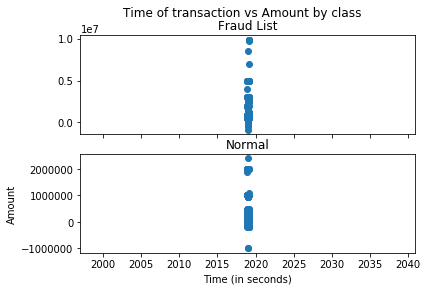

In [57]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
f.suptitle('Time of transaction vs Amount by class')

ax1.scatter(fraudlist.TransactionStartTime, fraudlist.Amount)
ax1.set_title('Fraud List')

ax2.scatter(normal.TransactionStartTime, normal.Amount)
ax2.set_title('Normal')

plt.xlabel('Time (in seconds)')
plt.ylabel('Amount')
plt.show()

### This Doesnt seem good lets rearrange it by scaling it from 1 to len(train.shape[0])

In [58]:
train.sort_values(by=['TransactionStartTime'],inplace=True)
train.reset_index(drop=True, inplace=True)
train['TransactionStartTime']=[i for i in range(train.shape[0])]

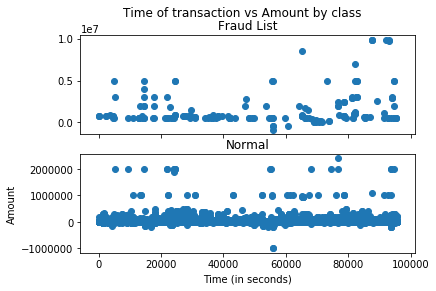

In [59]:
fraudlist = train[train.FraudResult == 1]
normal = train[train.FraudResult == 0]
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
f.suptitle('Time of transaction vs Amount by class')

ax1.scatter(fraudlist.TransactionStartTime, fraudlist.Amount)
ax1.set_title('Fraud List')

ax2.scatter(normal.TransactionStartTime, normal.Amount)
ax2.set_title('Normal')

plt.xlabel('Time (in seconds)')
plt.ylabel('Amount')
plt.show()

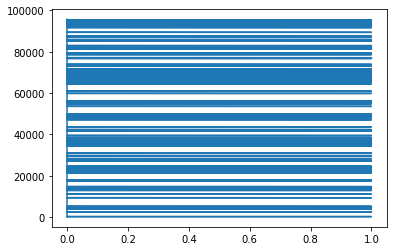

In [66]:
plt.plot(train.FraudResult,train.TransactionStartTime)
plt.show()

### You'll see that output is somewhat related with Time ✌🏻

## Lets Figure out the correlation between different attributes

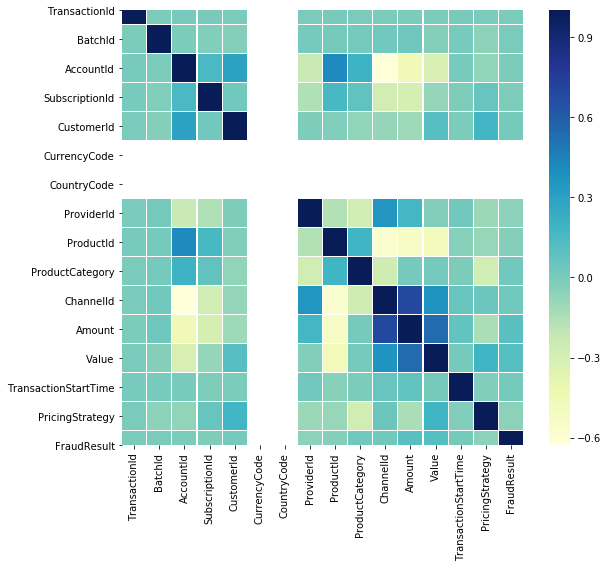

In [62]:
corrmat=train.apply(LabelEncoder().fit_transform).corr()
f, ax = plt.subplots(figsize =(9, 8)) 
sns.heatmap(corrmat, ax = ax, cmap ="YlGnBu", linewidths = 0.1)

### Since 2 columns only have a single value; therefore represented as white

## Let's see if we remove time then how many unique things are there.

In [71]:
train = train.drop('TransactionStartTime', axis=1)

In [87]:
train_ = train.iloc[:,7:].copy()

In [88]:
non_fraud = train_[train_.FraudResult==0].drop_duplicates()
fraud = train_[train_.FraudResult==1]
ls = [non_fraud,fraud]
train_ = pd.concat(ls)

In [89]:
train_.shape

(3890, 8)

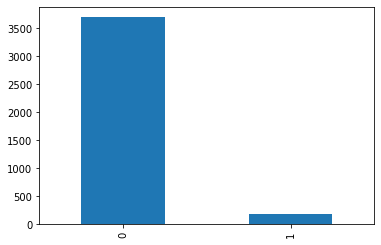

In [92]:
train_.FraudResult.value_counts().plot(kind='bar')

# Moving to Test Dataset------>>>>>

In [109]:
test = pd.read_csv('test.csv.xls')

In [110]:
for i in test.columns:
    len(test.TransactionId.value_counts())
    print(i)
    exec("print(len(test.%s.value_counts()))"%(i))

TransactionId
45019
BatchId
44684
AccountId
2471
SubscriptionId
2470
CustomerId
5018
CurrencyCode
1
CountryCode
1
ProviderId
6
ProductId
26
ProductCategory
9
ChannelId
5
Amount
998
Value
944
TransactionStartTime
44018
PricingStrategy
4


In [115]:
len(np.intersect1d(train.ProductId, test.ProductId))

22

### Try to compare unique ProductIDs in Test and Train 😁
### So there is one another unique ProductID there in Test data

## ------------------------
# If you're a beginner then I'll recommend you to try extracting visual insights from Test data by applying same code here.
## (I have already done this part, so dont worry I know evrything about test data 😅)

## ------------------------
# A big Thank You!!!  👍🏻👍🏻